Este es mi notebook original lo voy a dejar por aqui por si quieren ver (se espera borrar este documento a la entrega del trabajo)

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

In [4]:
def find_relevant_contours(filename):
    img = cv2.cvtColor(cv2.imread(filename), cv2.COLOR_BGR2RGB)
    grayimg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, thres = cv2.threshold(grayimg, 127, 255, 0)
    contours, hierarchy = cv2.findContours(thres, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    new_contours = []
    for i, c in enumerate(contours):
        if len(c) >= 100:
            new_contours.append(c)
    return new_contours

In [5]:
def find_extremes(contours):
    rotate_matrix = np.array([  [np.cos(45),  -np.sin(45)], 
                                [np.sin(45),  np.cos(45)]]) #Not clockwise

    for i, c in enumerate(contours):
        res = c.squeeze() @ rotate_matrix
        new_c = np.array([  c[np.argmin(res[:,0])],     #most left (up left in image)
                            c[np.argmin(res[:,1])],     #most up (up right in image)
                            c[np.argmax(res[:,0])],     #most right (down right in image)
                            c[np.argmax(res[:,1])]])    #most down (down left in image)
        if new_c.shape == np.unique(new_c, axis=0).shape:
            contours[i] = np.expand_dims(new_c, 1)
    return contours

In [8]:
def calculate_error(contours):
    minimum = [-1, np.inf]
    #52cm length - 11cm high
    m_dif = 11/52
    for i, c in enumerate(contours):
        c = c.squeeze()
        diag1, diag2 = abs(c[0] - c[2]), abs(c[1] - c[3])
        left_side, right_side = abs(c[0][1] - c[3][1]), abs(c[1][1] - c[2][1])
        up_side, down_side = abs(c[0][0] - c[1][0]), abs(c[2][0] - c[3][0])
        y_mean = (left_side + right_side) / 2
        x_mean = (up_side + down_side) / 2
        if up_side < 250 or down_side < 250 or up_side > 3000 or down_side > 3000 or right_side < 50 or left_side < 50 or right_side > 500 or left_side > 500:
            continue
        diag_error = abs(diag1[1]/diag1[0] - m_dif) + abs(diag2[1]/diag2[0] - m_dif) #hight and lenght difference must be similar to the license plate
        x_error = (abs(c[0][0]-c[3][0])/x_mean + abs(c[1][0]-c[2][0])/x_mean)
        y_error = (abs(c[0][1]-c[1][1])/y_mean + abs(c[0][1]-c[3][1])/y_mean)
        total_error = diag_error + x_error + y_error
        if total_error < minimum[1]:
            minimum = [i, total_error]
    return minimum

1.16597487561684 111
1.0287869469089976 84
1.3488243141169491 352
1.0872670469232384 143
1.0670885869494708 122
1.048452067290473 120
1.279538708649061 124
1.0857213430619077 131
inf 75
1.1868263650107245 91
1.0548757402636983 106
1.1058501475250808 123
1.1558886225370457 96
1.1115344892888497 83
1.1853685470433892 122


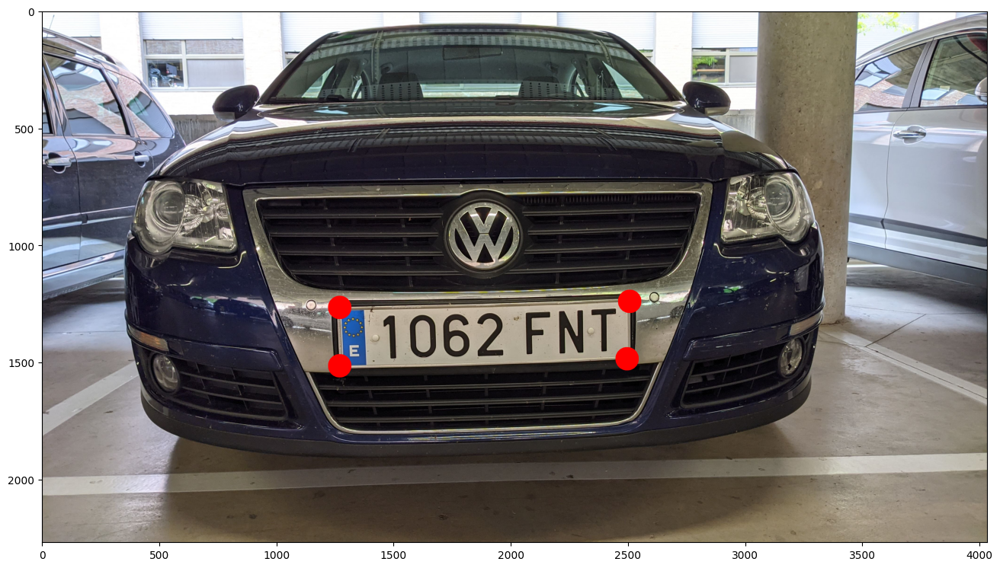

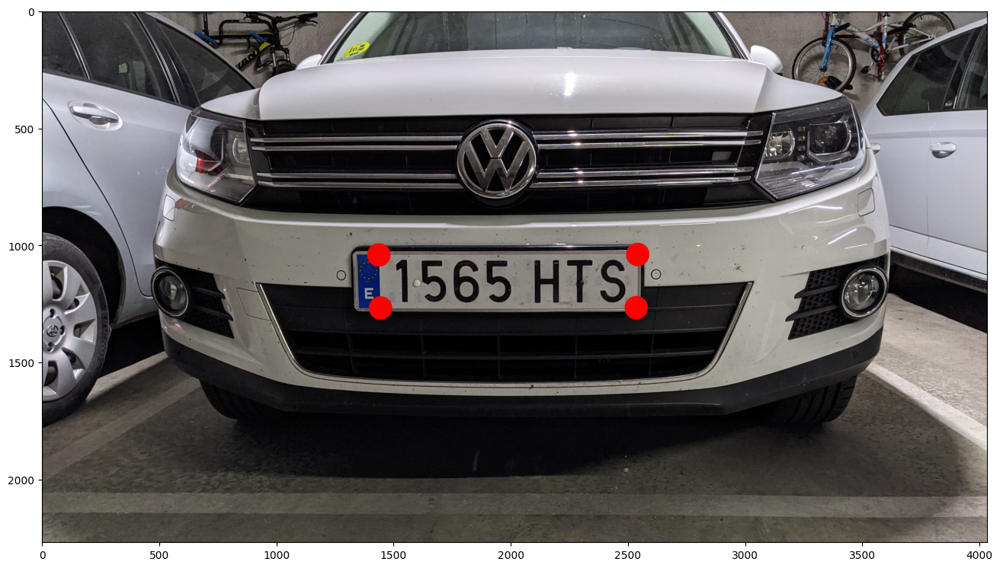

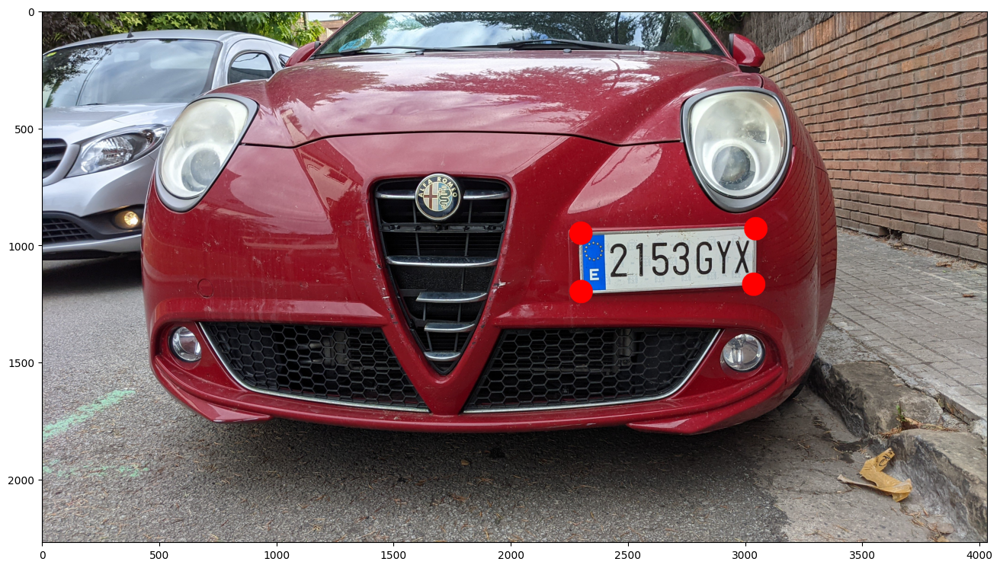

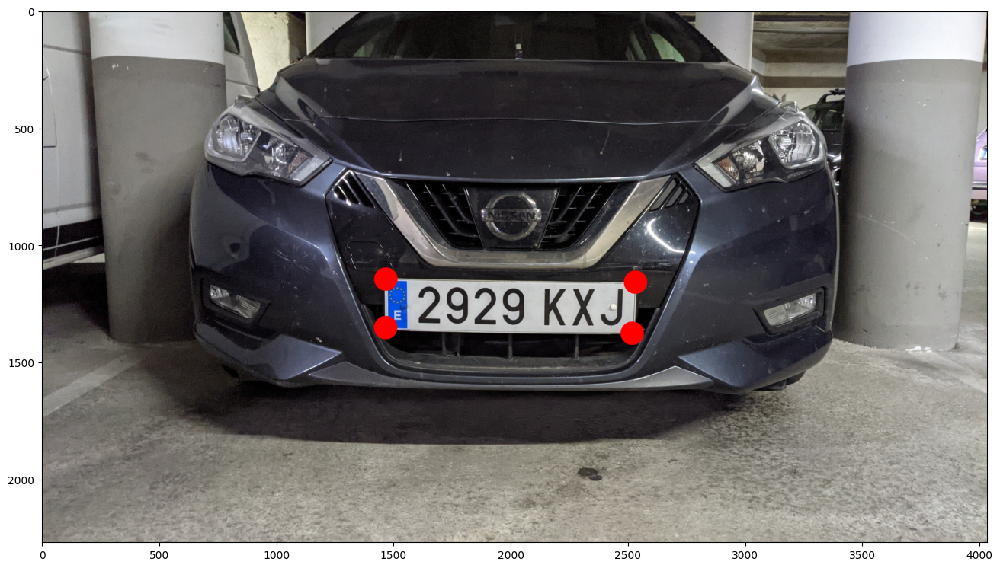

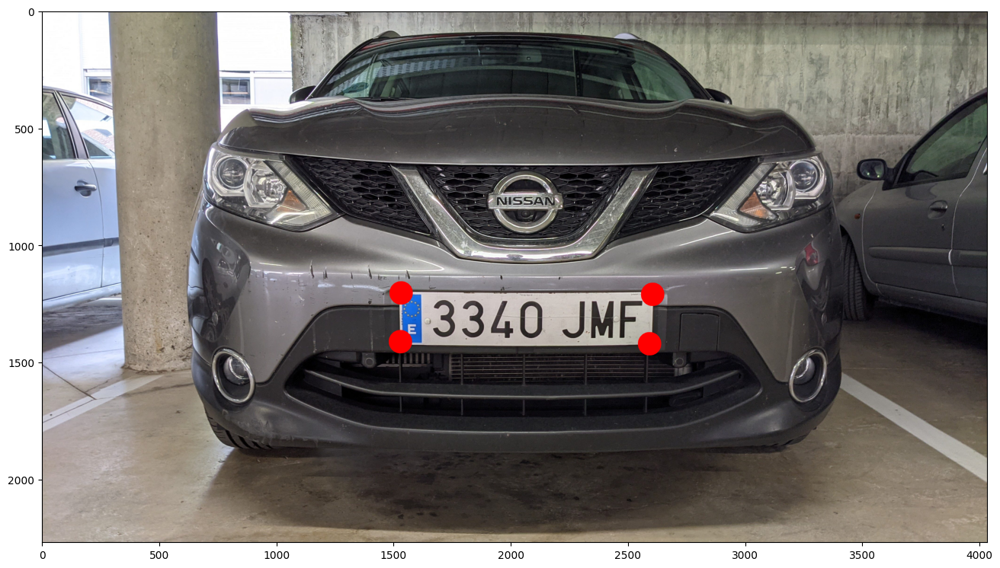

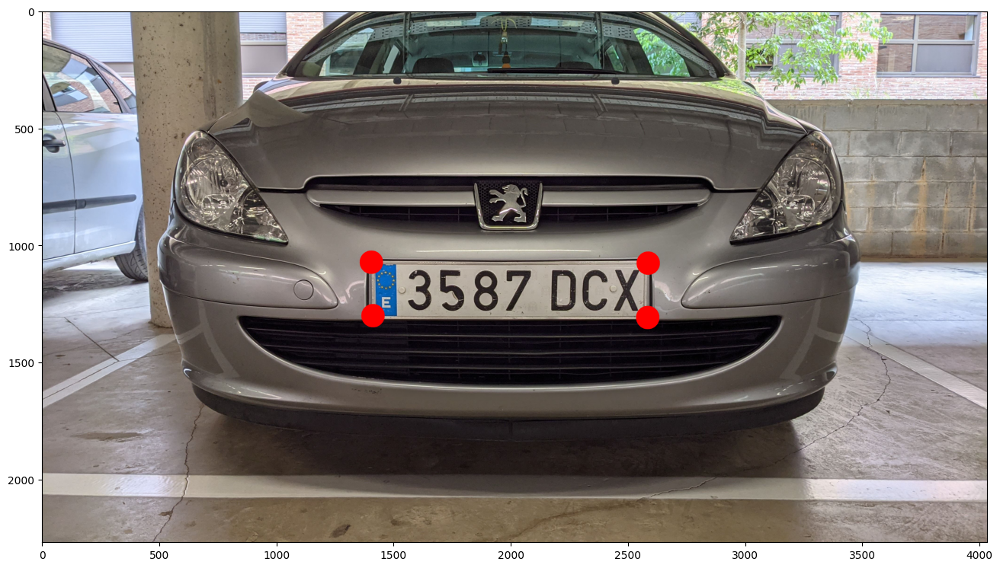

In [9]:
directory = "Test/Frontal/Frontal/"
for name in os.listdir(directory)[:-1]:
    contours = find_relevant_contours(directory+name)
    contours = find_extremes(contours)
    index, error = calculate_error(contours)
    print(error, len(contours))
    img = cv2.cvtColor(cv2.imread(directory+name), cv2.COLOR_BGR2RGB)
    cv2.drawContours(img, contours[index], -1, (255,0,0), 100)
    plt.figure(figsize=(16, 16))
    plt.imshow(img, cmap="gray")